## algorithm design and anlysis-2026 spring  homework 1 
**Deadline**：2026.5.20

**name**:


note：
---
1. 带有\*的题目，申请免上课的同学，必须完成，其他同学选作；
2. 请独立完成，如求助了他人或者大模型，请著明，并且不可省略算法分析部分；
4. 如若作答有雷同，全部取消成绩；
3. 需要书面作答的题目，可以通过引用图片的形式添加，但是注意上传项目时包含所引用的图片的源文件；
4. $log_n$ 默认表示$log_2{n}$;

## 问题 1

根据下列递归公式, 计算下列 $T(n)$ 对应的的渐近上界。要求所求的边界尽可能的紧（tight）, 请写明步骤。

1. $T(1)=1; T(n)=T(n/4)+1$ for $n>1$
2. $T(1)=1;T(n)=3T(n/3)+n^2$ for $n>1$
3. $T(1)=1;T(n)=T(2n/3)+1$ for $n>1$
4. $T(1)=1;T(n)=5T(n/4)+n$ for $n>1$
5. $T(n)=1 \ for\ n \le 2 ; T(n)=T(\sqrt{n})+1 \ for \ n>2$

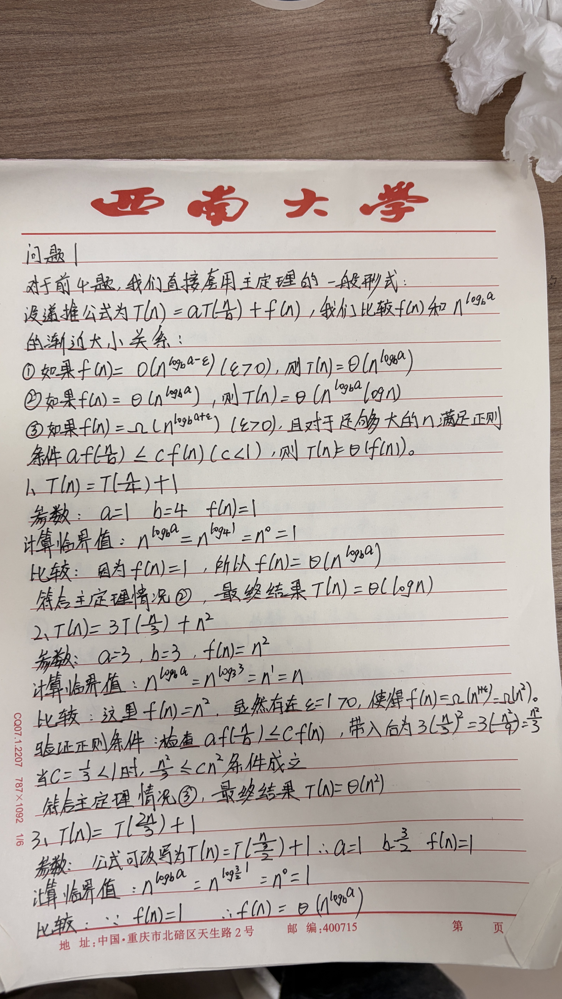
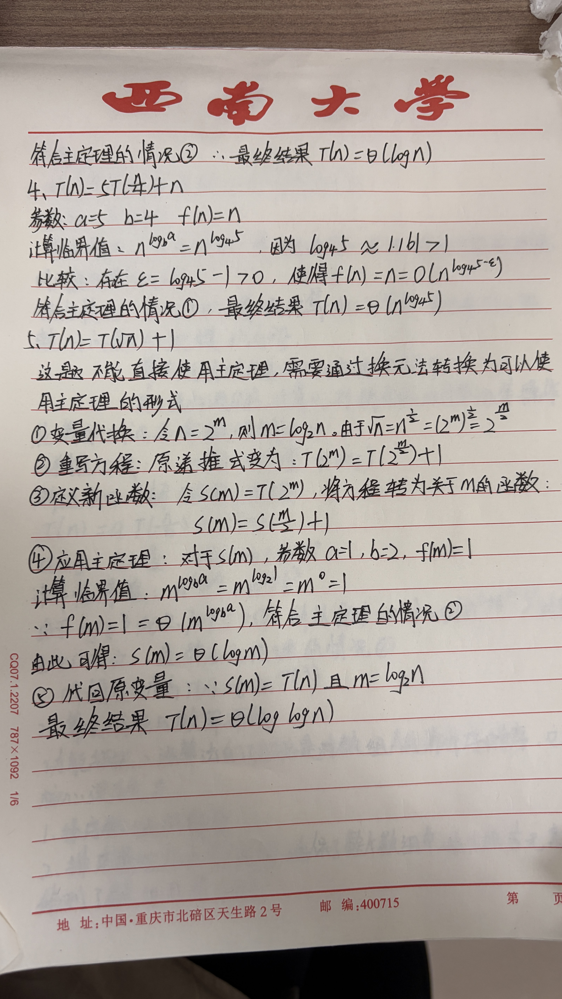

## 问题 2

观察下方的分治算法（divide-and-conquer algorithm）的伪代码, 回答下面问题

```latex
DoSomething(A,p,r)
-----
n := r-p+1
if n=2 and A[p]>A[r] then
    swap A[p] and A[r]
else if n >= 3 then
    m = ceil(2n/3)
    DoSomething(A,p,p+m-1)
    DoSomething(A,r-m+1,r)
    DoSomething(A,p,p+m-1)  
    
---
first call: DoSomething(A,1,n)
```

note：$ceil(2n/3)=\left\lceil {2n/3} \right\rceil$；$:=$ 表示赋值, 等价于 $\to$；A是一个包含n的整数元素的数组, 

1. 写出该算法时间复杂度的递归公式, 并求解其对应的渐进表示
2. 描述一下该算法的功能, 并判断是否是最高效的解决方案
3. \* 使用python编程实现上述算法或其对应的更高效版本的算法

idea:
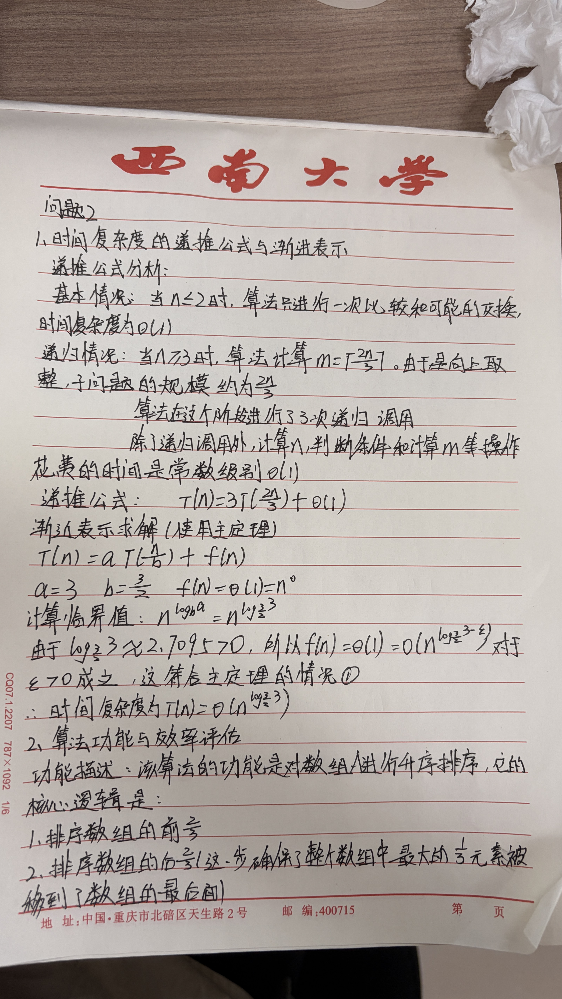
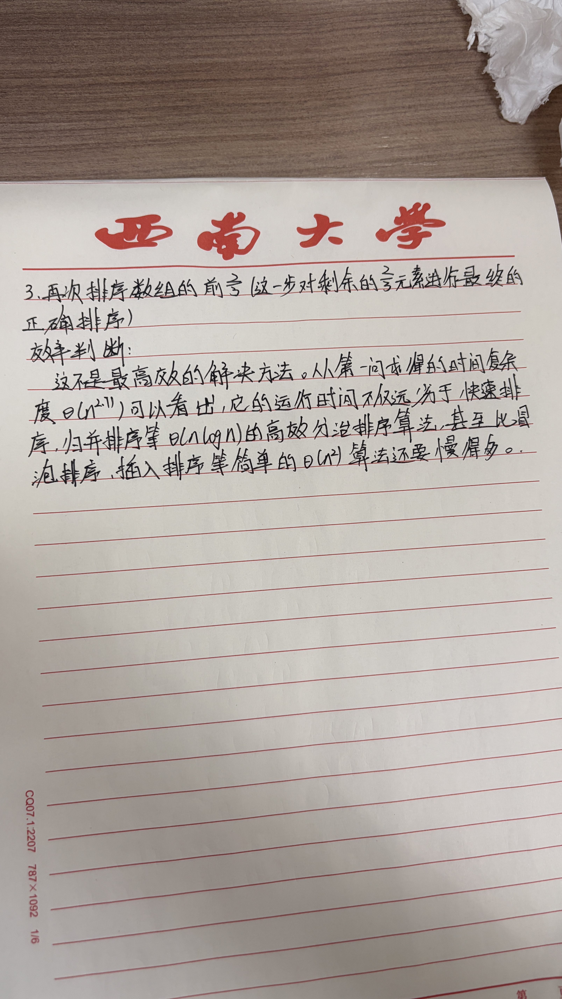

In [ ]:
# add your code here
def merge_sort(A):

    if len(A) <= 1:
        return A


    mid = len(A) // 2
    left_half = merge_sort(A[:mid])
    right_half = merge_sort(A[mid:])


    return merge(left_half, right_half)

def merge(left, right):
    sorted_arr = []
    i = j = 0


    while i < len(left) and j < len(right):
        if left[i] <= right[j]:
            sorted_arr.append(left[i])
            i += 1
        else:
            sorted_arr.append(right[j])
            j += 1


    sorted_arr.extend(left[i:])
    sorted_arr.extend(right[j:])

    return sorted_arr


if __name__ == "__main__":
    arr2 = [5, 2, 9, 1, 5, 6, 3]
    print("原数组:", arr2)
    sorted_arr2 = merge_sort(arr2)
    print("Merge Sort 后:", sorted_arr2)
# your algorithm time complexity is:时间复杂度是O(nlogn)，空间复杂度O(n)

## 问题 3

给定一个包含n个元素的数组 `profits` , 它的第 `i` 个元素 `profits[i]` 表示一支股票第 `i` 天的**收益**（正数表示涨, 负数表示跌）。你只能选择 **某一天** 买入这只股票, 并选择在 **未来的某一个不同的日子** 卖出该股票。

1. 设计一个算法来计算你所能获取的最大利润和对应买入和卖出的日期。请分析算法方案, 计算其时间复杂度, 并且使用python编程实现该算法。

2. \* 设计一个时间复杂度为 $O(n)$的算法实现该算法

e.g. :
---
profits=[3,2,1,-7,5,2,-1,3,-1], 第5天买入, 第8天卖出, 收益最大：9

idea:
1. 常规算法设计与分析 (暴力枚举法)
   算法方案分析：最直观的想法是穷举所有可能的买入日期i和卖出日期j。我们遍历数组，固定一个买入日i，然后向后扫描卖出日j，在扫描的过程中不断累加收益，并记录下遇到的最大总收益以及对应的买入和卖出日期。
2. 时间复杂度计算：
   外层循环确定买入点i，执行n次。内层循环确定卖出点j，平均执行n/2次。总的执行次数约为二分之n的平方。
   时间复杂度为 O(n^2)。空间复杂度为 O(1)，因为只使用了几个变量来记录状态。

In [29]:
# add your code here
def max_profit_brute_force(profits):
    n = len(profits)
    if n == 0:
        return 0, -1, -1

    max_profit = float('-inf')
    best_buy_day = -1
    best_sell_day = -1

    for i in range(n):
        current_sum = 0

        for j in range(i, n):
            current_sum += profits[j]

            if current_sum > max_profit:
                max_profit = current_sum
                best_buy_day = i + 1
                best_sell_day = j + 1

    return max_profit, best_buy_day, best_sell_day


profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]
profit, buy, sell = max_profit_brute_force(profits)
print(f"【O(n^2) 算法】第{buy}天买入，第{sell}天卖出，收益最大：{profit}")
# your algorithm time complexity is:时间复杂度为 O(n^2),空间复杂度为 O(1)

【O(n^2) 算法】第5天买入，第8天卖出，收益最大：9


In [4]:
def max_profit_kadane(profits):
    n = len(profits)
    if n == 0:
        return 0, -1, -1

    max_profit = float('-inf')
    current_profit = 0
    
    best_buy_day = -1
    best_sell_day = -1
    temp_buy_day = 1

    for i in range(n):
        current_profit += profits[i]

        if current_profit > max_profit:
            max_profit = current_profit
            best_buy_day = temp_buy_day
            best_sell_day = i + 1

        if current_profit < 0:
            current_profit = 0
            temp_buy_day = i + 2

    return max_profit, best_buy_day, best_sell_day


profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]
profit, buy, sell = max_profit_kadane(profits)
print(f"【O(n) 算法】 第{buy}天买入，第{sell}天卖出，收益最大：{profit}")

【O(n) 算法】 第5天买入，第8天卖出，收益最大：9


## 问题 4

给定一个包含不同整数元素的数组 $ A[1..n]$ ,并且满足条件：$A[1]>A[2]$ 并且 $A[n-1]<A[n]$; 规定：如果一个元素比它两边的邻居元素都小, 即：$A[x]<A[x-1], A[x]<A[x+1]$ , 称这个元素A[x]为“局部最小”。通过遍历一次数组, 我们可以很容易在 $O(n)$的时间复杂度下找到一个局部最小值, 


1. 分析该问题, 设计一个算法在$O(logn)$的时间复杂度下找到一个局部最小(返回数值), 要求：分析算法设计思路, 并且使用python编程实现
2. \* 设计算法找出所有局部最小值, 分析算法设计思路, 并使用python编程实现

e.g.:
---
A=[9, 3, 7, 2, 1, 4, 5 ] 时,  局部最小元素为 3, 1

idea:
1. 在O(logn)时间复杂度下找到一个局部最小
   算法设计思路：
   要在 O(logn)的时间内搜索数组，我们必须使用二分查找法。这道题能够使用二分查找的核心依据是其边界条件构成的势能陷阱：
   （1）已知开头是下降趋势 (A[0] > A[1])。
   （2）已知结尾是上升趋势 (A[n-2] < A[n-1])。
   （3）因为数组元素互不相同，一条线如果开头往下走，结尾往上走，那么在中间至少存在一个“谷底”（局部最小值）。
   我们可以通过检查中间元素A[mid]的走势来缩小范围：
   如果 A[mid] < A[mid-1]且 A[mid] < A[mid+1]，那么A[mid]就是我们要找的局部最小，直接返回。
   如果 A[mid] > A[mid+1]，说明中间位置处于下降趋势。既然这里还在下降，而最右侧边界是上升的，那么在mid的右半侧必定存在一个局部最小。我们令 left = mid + 1。
   如果 A[mid] > A[mid-1]，说明中间位置处于上升趋势。既然这里在上升，而最左侧边界是下降的，那么在mid的左半侧必定存在一个局部最小。我们令 right = mid - 1。

In [30]:
# add your code here
def find_one_local_minimum(A):

    n = len(A)

    left = 1
    right = n - 2

    while left <= right:
        mid = (left + right) // 2
        if A[mid] < A[mid - 1] and A[mid] < A[mid + 1]:
            return A[mid]
        elif A[mid] > A[mid + 1]:
            left = mid + 1
        else:
            right = mid - 1
    return None

A = [9, 3, 7, 2, 1, 4, 5]
print(f"找到的一个局部最小值为: {find_one_local_minimum(A)}")
# your algorithm time complexity is:时间复杂度O(logn)，空间复杂度o(H)

找到的一个局部最小值为: 1


idea:
2. 找出所有局部最小值
  算法设计思路：
  当目标从找一个变成找所有时，由于局部最小值可能分布在数组的任何位置（例如：数组呈现波浪形），极端情况下可能存在O(n)个局部最小值。我们无法跳过任何一个元素不检查，因为被跳过的元素可能就是一个局部的谷底。
  因此，寻找所有局部最小值无法通过二分查找实现，其最优的时间复杂度就是O(n)。
  思路非常直接：线性遍历（一次扫描）。我们只需要从索引1遍历到n-2，依次判断每个元素是否同时小于其左邻居和右邻居即可。如果满足条件，将其收集到结果列表中。

In [31]:
def find_all_local_minima(A):

    n = len(A)
    minima_list = []

    for i in range(1, n - 1):
        if A[i] < A[i - 1] and A[i] < A[i + 1]:
            minima_list.append(A[i])
            
    return minima_list

A = [9, 3, 7, 2, 1, 4, 5]
print(f"找到的所有局部最小值为: {find_all_local_minima(A)}")
# your algorithm time complexity is:时间复杂度O(n)，空间复杂度o(n)

找到的所有局部最小值为: [3, 1]


## 问题 5

给定包含n个不同数字的一组数, 寻找一种基于比较的算法在这组数中找到k个最小的数字, 并按顺序输出它们。

1. 将n个数先进行排序, 然后按顺序输出最小的k个数。要求：选择合适的排序算法实现上述操作, 计算算法时间复杂度, 并使用python编程实现。
2. 建立一个包含这n个数的堆（heap）, 并且调用 k 次Extract-min 按顺序输出最小的k个数。使用往空堆中不断插入元素的方法建立堆, 分析这种方法建堆的时间复杂度, 并使用python编程实现
3. \* 假设数组中包含的数据总数目超过了计算机的存储能力, 请设计一个算法, 找到这堆数据的前k小的数值, 计算时间复杂度, 并使用python实现该算法, 假设计算机一定能存储k个数据。

e.g.：
---
数组arr=[5,4,3,2,6,1,88,33,22,107] 的前3个最小数据为：1, 2, 3

idea:
1. 基于全排序的解决方案
   算法方案与思路：最直观的方法是将整个数组先进行升序排序，然后直接截取前k个元素输出。为了保证效率，我们选择时间复杂度为O(nlogn)的排序算法，例如快速排序 (Quick Sort)或归并排序 (Merge Sort)。这里我们在代码中手写一个简洁的快速排序来实现。
2. 时间复杂度计算：排序过程：使用快速排序（平均情况）或归并排序，时间复杂度为O(nlogn)。
   截取过程：只需输出前k个元素，时间复杂度为O(k)。总时间复杂度：O(nlogn+k)。由于通常 k<=n，整体渐进时间复杂度O(nlogn)。

In [32]:
# add your code here
def quick_sort(arr):

    if len(arr) <= 1:
        return arr
    pivot = arr[len(arr) // 2]
    left = [x for x in arr if x < pivot]
    middle = [x for x in arr if x == pivot]
    right = [x for x in arr if x > pivot]
    return quick_sort(left) + middle + quick_sort(right)
def top_k_by_sorting(arr, k):
    sorted_arr = quick_sort(arr)
    return sorted_arr[:k]
# your algorithm time complexity is:总时间复杂度：O(nlogn)，空间复杂度o(n)

idea:
2. 基于最小堆 (Min-Heap) 的解决方案
  算法方案与思路：题目明确要求使用往空堆中不断插入元素的方法建立堆。这意味着我们不能使用O(n)的最优建堆算法（如 Floyd 建堆法），而是要模拟逐步将元素 push 进堆的过程。建好堆后，执行k次 pop 操作（即 Extract-min），依次取出的就是最小的k个数。
  时间复杂度计算：建堆过程：往大小为i的堆中插入一个元素的时间是O(logi)。执行n次插入操作，因此，这种逐个插入建堆的方法时间复杂度为O(nlogn)。
  提取过程：执行k次 Extract-min 操作，每次耗时O(logn)。总提取时间为O(klogn)。
  总时间复杂度：O(nlogn + klogn)，即O(nlogn)。

In [26]:
import heapq

def top_k_by_min_heap(arr, k):
    min_heap = []

    for num in arr:
        heapq.heappush(min_heap, num)
    result = []
    for _ in range(k):
        result.append(heapq.heappop(min_heap))
    return result
# your algorithm time complexity is:时间复杂度：O(nlogn)，空间复杂度o(n)
    

idea:
3. 海量数据受限内存解决方案
   算法方案与思路：当数据量n远大于计算机内存时，我们无法将整个数组读入内存排序或建堆。但题目已知内存可以存下k个数据，所以我们可以在内存中维护一个大小为k的最大堆 (Max-Heap)。
   具体流程如下：
   (1)读取数据流的前k个元素，构建一个大小为k的最大堆。堆顶元素就是这k个数中的最大值。
   (2)继续遍历后续的n - k个数据：
   如果当前读取的数据大于或等于最大堆的堆顶元素，直接丢弃（因为它不可能进入前k小的行列）。
   如果当前读取的数据小于最大堆的堆顶元素，说明目前堆顶的那个元素被淘汰了。我们将堆顶元素弹出，把新数据压入堆中。
   (3)遍历完所有数据后，留在堆里的k个元素就是整个海量数据集中最小的k个元素。最后将其升序输出即可。
   时间复杂度计算：
   初始建堆：构建大小为k的堆，时间复杂度为O(klogk)或O(k)。
   流式处理：对于剩下的n-k个元素，最坏情况下每个都要进堆替换堆顶，单次替换调整耗时O(logk)。总处理时间为O((n-k)logk)。
   总时间复杂度：合并起来为O(nlogk)。
  

In [33]:
import heapq

def top_k_massive_data(arr_stream, k):
    if k == 0: return []
    max_heap = []
    for i, num in enumerate(arr_stream):
        if i < k:
            heapq.heappush(max_heap, -num)
        else:
            if num < -max_heap[0]:
                heapq.heappop(max_heap)
                heapq.heappush(max_heap, -num)

    result = [-x for x in max_heap]
    result.sort()
    return result
# your algorithm time complexity is:总时间复杂度：O(nlogk)，空间复杂度o(k)

In [34]:
if __name__ == "__main__":
    arr = [5, 4, 3, 2, 6, 1, 88, 33, 22, 107]
    k = 3
    print(f"原数组: {arr}")
    print(f"k = {k}\n")
    
    print("1. 全排序法结果:", top_k_by_sorting(arr, k))
    print("2. 最小堆法结果:", top_k_by_min_heap(arr, k))

    arr_stream = iter([5, 4, 3, 2, 6, 1, 88, 33, 22, 107])
    print("3. 海量数据流法结果:", top_k_massive_data(arr_stream, k))

原数组: [5, 4, 3, 2, 6, 1, 88, 33, 22, 107]
k = 3

1. 全排序法结果: [1, 2, 3]
2. 最小堆法结果: [1, 2, 3]
3. 海量数据流法结果: [1, 2, 3]


## 问题 6

> 星球碰撞问题：现有n个星球，在同一条直线上运行，如数组A所示，元素的绝对值表示星球的质量，负数表示星球自右向左运动，正数表示星球自左向右运动，当两个星球相撞的时候，质量小的会消失，大的保持不变，**质量相同的两个星球碰撞后自右向左运动的星球消失，自左向右的星球保持不变**，假设所有星球的速度大小相同。
>
> $ A=[23,-8, 9, -3, -7, 9, -23, 22] $

请设计一个算法模拟星球的运行情况，输出最终的星球存续情况（输出一个数组），分析算法设计思路，计算时间复杂度，并基于python编程实现。

e.g.
---
1.  输入： A=[-3,-6,2,8, 5,-8,9,-2,1]， 输出：[-3, -6, 2, 8, 9, 1]

2. 输入：A=[23,-8, 9, -3, -7, 9, -23, 22], 输出：[23, 22]

idea:
1. 算法设计思路
   我们可以使用一个栈（Stack）来模拟星球的运行和碰撞过程。从左到右遍历数组A中的每一个星球：
（1）入栈条件（无碰撞）：如果栈为空，直接入栈。如果当前星球向右运动（正数），它永远不会追上前面向右运动的星球，也不会和前面向左运动的星球相撞，直接入栈。如果当前星球向左运动（负数），且栈顶星球也是向左运动（负数），它们同向而行，速度相同，不会相撞，直接入栈。
（2）碰撞条件：只有当栈顶星球向右运动（正数）且当前星球向左运动（负数）时，才会发生碰撞。
（3）碰撞结算规则： 当发生碰撞时，比较栈顶星球的质量 abs(stack[-1]) 和当前星球的质量 abs(p)：
   如果栈顶质量 < 当前质量：栈顶星球被撞毁（出栈 pop）。由于当前星球还在继续向左飞行，它可能还会与栈中更前面的星球相撞，因此需要继续进行 while 循环判断。
   如果栈顶质量 == 当前质量：根据题意，“自右向左运动的星球（即当前负数星球）消失，自左向右的星球（即栈顶正数星球）保持不变”。因此，栈顶星球保留，当前星球被销毁，结束当前的碰撞检测（break）。
   如果栈顶质量 > 当前质量：当前星球被撞毁，栈顶星球安然无恙。结束当前的碰撞检测（break）。
（4）如果当前星球在经历了一系列可能的碰撞后依然存活（没有被 break 掉），则将其压入栈中。
2. 时间与空间复杂度分析
   时间复杂度：O(n)。虽然代码中有一个 while 循环嵌套在 for 循环内部，但由于每个星球最多入栈一次，且最多出栈一次。因此，平摊到每次操作，while 循环的执行总次数不会超过 n次。总体时间复杂度为线性的 O(n)。
   空间复杂度：O(n)。最坏情况下（例如所有星球都向右运动，或者所有星球都向左运动，不会发生任何碰撞），所有的星球都会被压入栈中，此时栈占用O(n)的额外空间。

In [35]:
# add your code here
def simulate_planets(A):
    stack = []
    for p in A:
        survived = True
        while stack and stack[-1] > 0 and p < 0:
            top_mass = stack[-1]
            p_mass = abs(p)
            if top_mass < p_mass:

                stack.pop()
            elif top_mass == p_mass:

                survived = False 
                break
            else:

                survived = False
                break

        if survived:
            stack.append(p)
            
    return stack


if __name__ == "__main__":
    A1 = [-3, -6, 2, 8, 5, -8, 9, -2, 1]
    result1 = simulate_planets(A1)
    print(f"测试用例 1:\n输入: {A1}\n输出: {result1}")
    print("-" * 30)
    
    A2 = [23, -8, 9, -3, -7, 9, -23, 22]
    result2 = simulate_planets(A2)
    print(f"测试用例 2:\n输入: {A2}\n输出: {result2}")
# your algorithm time complexity is:时间复杂度：O(n)，空间复杂度：O(n)


测试用例 1:
输入: [-3, -6, 2, 8, 5, -8, 9, -2, 1]
输出: [-3, -6, 2, 8, 9, 1]
------------------------------
测试用例 2:
输入: [23, -8, 9, -3, -7, 9, -23, 22]
输出: [23, 22]


## 问题 7

> 0-1背包问题：现在有4块大理石，每个大理石对应的重量和价值使用一个元组表示, 即（重量，价值），4块大理石的重量和价值为：[(5,10), (4,40), (6,30), (3, 50)], 假设你有一辆最大承重为9的小推车，请问使用这个小推车装大理石的最大价值为多少

请设计一个算法解决该问题，分析算法设计思路，计算时间复杂度，并基于python编程实现

idea:
1. 算法设计思路 (动态规划 Dynamic Programming)
   解决 0-1 背包问题最常用的高效方法是动态规划。贪心算法（比如每次拿性价比最高的大理石）在这里往往行不通，因为它无法保证凑出最优的重量组合。
   核心思想：我们将大问题分解为小问题：面对第i块大理石和当前的剩余容量j，我们究竟是选择装下它，还是不装它
   状态定义：定义一个二维数组 dp[i][j]，它表示在前i块大理石中做选择，当小推车最大承重为j时，所能装载的最大价值。
   状态转移方程：对于第i块大理石（重量为w[i]，价值为v[i]）：
   （1）装不下：如果当前大理石的重量w[i]已经超过了当前的承重j，那我们只能选择不装。此时的最大价值等于我们在前i-1块大理石中做选择的最大价值。dp[i][j] = dp[i-1][j]
   （2）能装下：如果能装下，我们有两种选择：
   不装它：价值还是dp[i-1][j]。
   装下它：那我们必须为它腾出w[i]的重量。装下它之后的总价值等于：这块大理石本身的价值v[i]+ 用剩下的容量(j - w[i])去装前i-1块大理石能得到的最大价值dp[i-1][j-w[i]]。我们要取这两种选择中较大的那个：dp[i][j] = max(dp[i-1][j]，dp[i-1][j-w[i]] + v[i])
   空间优化（一维 DP 数组）：在实际编程中，我们发现计算第i行的状态只依赖于第i-1行的状态。因此，我们可以将二维数组压缩成一个一维数组 dp[j]。为了保证每个物品只被放入一次，内层循环更新容量j时，必须从大到小逆序遍历。
2. 时间与空间复杂度分析
   假设大理石的数量为N(本题N=4)，小推车的最大承重为W(本题W=9)。
   时间复杂度：O(N*W)。算法需要两层嵌套循环，外层遍历N个物品，内层遍历W种容量状态。在这个具体的题目中，计算量非常小（4 \times 9 = 36步）。
   空间复杂度：O(W)。如果使用优化后的一维动态规划数组，只需要大小为W+1的额外空间。

In [14]:
# add your code here
def knapsack_01(items, max_capacity):

    dp = [0] * (max_capacity + 1)

    for weight, value in items:

        for j in range(max_capacity, weight - 1, -1):

            dp[j] = max(dp[j], dp[j - weight] + value)

    return dp[max_capacity]


marbles = [(5, 10), (4, 40), (6, 30), (3, 50)]
max_weight = 9

max_val = knapsack_01(marbles, max_weight)

print(f"4块大理石的重量和价值为: {marbles}")
print(f"小推车最大承重: {max_weight}")
print(f"小推车装大理石的最大价值为: {max_val}")

# 算法时间复杂度为: O(N * W)，其中N为物品数量，W为最大承重
# your algorithm time complexity is: 时间复杂度：O(N*W)，空间复杂度：O(W)

4块大理石的重量和价值为: [(5, 10), (4, 40), (6, 30), (3, 50)]
小推车最大承重: 9
小推车装大理石的最大价值为: 90


## 问题 8

给你二叉搜索树的根节点 root ，该树中的恰好两个节点的值被错误地交换。请在不改变其结构的情况下，恢复这棵树 。设计算法解决该问题，分析算法设计思路，计算时间复杂度，并基于python编程实现

e.g.:
---
1.

<div style="text-align:center;width:200px;"> <img alt="" src="./fig/hw3q9-1.jpg"> </div>
输入：root = [1,3,null,null,2]， 输出为：[3,1,null,null,2]， 

解释：3 不能是 1 的左孩子，因为 3 > 1 。交换 1 和 3 使二叉搜索树有效。

2.

 <div style="text-align:center;width:200px;"> <img alt="" src="./fig/hw3q9-1.jpg"> </div>
输入： root=[3,1,4,null,null,2]， 输出为：[2,1,4,null,null,3]

解释：2 不能在 3 的右子树中，因为 2 < 3 。交换 2 和 3 使二叉搜索树有效。

idea:
1. 算法设计思路
核心特性：
一个有效的二叉搜索树，其中序遍历（左-中-右）的结果必定是一个严格递增的序列。
异常分析：
如果树中有恰好两个节点的值被错误交换，那么这个中序遍历的递增序列就会被破坏，产生“降序对”（即前一个节点的值大于当前节点的值）。由于只交换了两个节点，情况只分为两种：
（1）相邻的节点被交换：例如正确的序列是[1, 2, 3, 4, 5]，交换 3 和 4 后变成 [1, 2, 4, 3, 5]。这里只会出现一次降序对（4>3）。被交换的两个节点分别是降序对的第一个节点（4）和第二个节点（3）。
（2）不相邻的节点被交换：例如正确的序列是 [1, 2, 3, 4, 5]，交换 2 和 5 后变成 [1, 5, 3, 4, 2]。这里会出现两次降序对（5>3和 4>2）。被交换的两个节点分别是第一次降序对的第一个节点（5）和第二次降序对的第二个节点（2）。
算法步骤：
在进行中序遍历的过程中，维护一个 prev 指针记录上一个访问的节点。
比较 prev.val 和当前 node.val。如果发现 prev.val > node.val，说明找到了逆序对。
使用两个指针 first 和 second 来记录需要交换的节点：
如果是第一次遇到逆序，记录 first = prev，second = node。
如果是第二次遇到逆序，只需要更新 second = node。
遍历结束后，直接交换 first 和 second 节点内的值（无需改变树的物理指针结构，题目允许只交换值）。
2. 时间与空间复杂度分析假设树中共有N个节点，树的高度为H。
   时间复杂度：O(N)。在最坏情况下，我们需要遍历完整棵树才能找到那两个被交换的节点（例如这两个节点在树的最右侧）。
   空间复杂度：O(H)。这里使用了递归进行中序遍历，空间复杂度主要取决于递归调用栈的深度，也就是树的高度H。对于平衡二叉树，空间复杂度为O(logN)；对于退化成链表的极端不平衡二叉树，空间复杂度为 O(N)。

In [16]:
# add your code here

class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right

class Solution:
    def recoverTree(self, root: TreeNode) -> None:

        self.first = None
        self.second = None

        self.prev = TreeNode(float('-inf'))

        def inorder(node):
            if not node:
                return

            inorder(node.left)

            if self.prev.val > node.val:

                if not self.first:
                    self.first = self.prev

                self.second = node

            self.prev = node

            inorder(node.right)

        inorder(root)

        if self.first and self.second:
            self.first.val, self.second.val = self.second.val, self.first.val

# ================= 辅助测试代码 =================

def print_inorder(root):

    res = []
    def inorder(node):
        if not node: return
        inorder(node.left)
        res.append(node.val)
        inorder(node.right)
    inorder(root)
    return res

if __name__ == "__main__":

    root1 = TreeNode(1)
    root1.left = TreeNode(3)
    root1.left.right = TreeNode(2)
    
    print(f"例1修复前中序遍历: {print_inorder(root1)}")
    Solution().recoverTree(root1)
    print(f"例1修复后中序遍历: {print_inorder(root1)}")
    
    print("-" * 30)
    

    root2 = TreeNode(3)
    root2.left = TreeNode(1)
    root2.right = TreeNode(4)
    root2.right.left = TreeNode(2)
    
    print(f"例2修复前中序遍历: {print_inorder(root2)}")
    Solution().recoverTree(root2)
    print(f"例2修复后中序遍历: {print_inorder(root2)}")
# your algorithm time complexity is:时间复杂度：O(N)，空间复杂度：O(H)

例1修复前中序遍历: [3, 2, 1]
例1修复后中序遍历: [1, 2, 3]
------------------------------
例2修复前中序遍历: [1, 3, 2, 4]
例2修复后中序遍历: [1, 2, 3, 4]


## 问题 9 \*
给定 `n` 个非负整数表示每个宽度为 `1` 的柱子的高度图，计算按此排列的柱子，下雨之后能接多少雨水。



<div style="text-align:center;width:800px;"> <img alt="" src="./fig/hw3q6.png"> </div>

请分析算法设计思路，计算时间复杂度，并基于python编程实现

idea:
1. 算法设计思路
   我们可以把每一列能够接到的雨水单独计算，最后累加起来。对于任意一个位置 i，它能装多少水，取决于它左右两边最高柱子的较小值（这很像“木桶效应”）。
   具体公式为：水滴数[i] = min(左边最高的柱子, 右边最高的柱子) - height[i]。（如果算出来是负数，则说明装不了水，记为 0）。
   为了高效计算，最优雅的解法是使用双指针法 (Two Pointers)，它可以将空间复杂度从O(n)优化到 O(1)。
   双指针法执行逻辑：
   （1）维护两个指针 left 和 right，分别指向数组的头和尾。
   （2）维护两个变量 left_max 和 right_max，记录从左到右、从右到左遍历到的最高柱子高度。
   （3）比较 height[left] 和 height[right]：
   如果 height[left] < height[right]：说明对于 left 指针所在的这列，其右侧必然存在一个比当前 left_max 更高（或相等）的边界（至少是 height[right]）。因此，left 这一列能接的水量完全由 left_max 决定。我们计算 left 处的水量，并将 left 指针向右移动一步。
   如果 height[left] >= height[right]：同理，说明对于 right 指针所在的这列，其左侧必然存在一个足够高的边界，它能接的水完全由 right_max 决定。我们计算 right 处的水量，并将 right 指针向左移动一步。
   （4）当 left 和 right 相遇时，遍历结束。
2. 时间与空间复杂度分析
   时间复杂度：O(n)。left 和 right 指针相向而行，每个元素最多被访问一次，整个数组只遍历一遍。
   空间复杂度：O(1)。算法执行过程中只使用了几个额外的变量（left, right, left_max, right_max, water），没有开辟新的数组空间，极其高效。

In [18]:
# add your code here
def trap(height):

    if not height or len(height) < 3:
        return 0

    n = len(height)
    left, right = 0, n - 1
    left_max, right_max = 0, 0
    water = 0

    while left < right:
        if height[left] < height[right]:

            if height[left] >= left_max:

                left_max = height[left]
            else:

                water += left_max - height[left]
            left += 1
        else:

            if height[right] >= right_max:

                right_max = height[right]
            else:

                water += right_max - height[right]
            right -= 1

    return water

# ================= 辅助测试代码 =================

if __name__ == "__main__":
    # 示例 1
    height1 = [0, 1, 0, 2, 1, 0, 1, 3, 2, 1, 2, 1]
    res1 = trap(height1)
    print(f"示例 1 输入: {height1}")
    print(f"示例 1 输出: {res1} (预期: 6)\n")

    # 示例 2
    height2 = [4, 2, 0, 3, 2, 5]
    res2 = trap(height2)
    print(f"示例 2 输入: {height2}")
    print(f"示例 2 输出: {res2} (预期: 9)")
# your algorithm time complexity is:时间复杂度：O(n)，空间复杂度：O(1)

示例 1 输入: [0, 1, 0, 2, 1, 0, 1, 3, 2, 1, 2, 1]
示例 1 输出: 6 (预期: 6)

示例 2 输入: [4, 2, 0, 3, 2, 5]
示例 2 输出: 9 (预期: 9)


## 问题 10

给你一个二叉树的根节点 root ，树中每个节点都存放有一个 0 到 9 之间的数字。每条从根节点到叶节点的路径都代表一个数字：

> 例如，从根节点到叶节点的路径 1 -> 2 -> 3 表示数字 123 。

设计一个算法计算从根节点到叶节点生成的所有数字之和 ，分析算法设计思路，计算时间复杂度，并基于python编程实现

叶节点:是指没有子节点的节点。

e.g.:
---
1.

 <div style="text-align:center;width:200px;"> <img alt="figure" src="./fig/hw3q10-1.jpg"> </div>

 输入：root = [1,2,3], 输出：25

解释：从根到叶子节点路径 1->2 代表数字 12，1->3 代表数字 13，因此和为 12 + 13 = 25 。

2.

 <div style="text-align:center;width:200px;"> <img alt="figure" src="./fig/hw3q10-2.jpg"> </div>

 输入：root = [4,9,0,5,1], 输出：1026

解释：从根到叶子节点路径 4->9->5 代表数字 495，4->9->1 代表数字 491，4->0 代表数字 40。因此和为 495 + 491 + 40 = 1026 。

idea:
1. 算法设计思路
  我们要计算所有从根节点到叶子节点的路径所代表的数字之和。因为数字是按层级递进的（父节点是高位，子节点是低位），我们可以使用深度优先搜索 (DFS)，自顶向下地遍历整棵树。
  核心逻辑：
  （1）数字的拼接：在顺着树向下遍历的过程中，每当我们从父节点走到子节点，当前路径代表的数字就会“左移一位并加上当前节点的值”。数学表达式为：当前路径数值 = 之前的路径数值 * 10 + 当前节点的值。
  （2)终止条件（遇到叶子节点）：当遍历到一个节点，且该节点既没有左子节点也没有右子节点时（即叶子节点），说明一条完整的路径已经形成。此时我们将这根路径计算出的数值返回。
  (3)递归与汇总：如果当前节点不是叶子节点，我们就分别递归计算它的左子树和右子树所能生成的路径之和，然后将这两部分的和相加，作为当前分支的总和返回给上一层。
  (4)空节点处理：如果当前节点为空，它对总和的贡献为 0。
2. 时间与空间复杂度分析
   假设树中共有N个节点，树的最大高度为H。
   时间复杂度：O(N)。因为我们需要使用 DFS 遍历二叉树中的每一个节点，且每个节点恰好被访问一次，每次访问进行常数时间O(1)的计算（乘法和加法）。
   空间复杂度：O(H)。由于使用递归，空间开销主要来自于隐式调用的系统栈。栈的深度等于二叉树的高度 H。在最坏情况下（树退化成单链表），高度 H = N，空间复杂度为O(N)。在最好情况下（树是完全二叉树），高度H = logN，空间复杂度为O(logN)

In [20]:
# add your code here

class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right

class Solution:
    def sumNumbers(self, root: TreeNode) -> int:

        def dfs(node, current_sum):

            if not node:
                return 0

            current_sum = current_sum * 10 + node.val

            if not node.left and not node.right:
                return current_sum
            

            left_sum = dfs(node.left, current_sum)
            right_sum = dfs(node.right, current_sum)
            
            return left_sum + right_sum

        return dfs(root, 0)

# ================= 辅助测试代码 =================

if __name__ == "__main__":
    sol = Solution()

    root1 = TreeNode(1)
    root1.left = TreeNode(2)
    root1.right = TreeNode(3)
    
    res1 = sol.sumNumbers(root1)
    print(f"示例 1 输出: {res1} (预期: 25)")
    
    print("-" * 30)

    root2 = TreeNode(4)
    root2.left = TreeNode(9)
    root2.right = TreeNode(0)
    root2.left.left = TreeNode(5)
    root2.left.right = TreeNode(1)
    
    res2 = sol.sumNumbers(root2)
    print(f"示例 2 输出: {res2} (预期: 1026)")
# your algorithm time complexity is:时间复杂度：O(N),空间复杂度：O(H)

示例 1 输出: 25 (预期: 25)
------------------------------
示例 2 输出: 1026 (预期: 1026)
